# YOLOv8 Training for Giraffe and Rhinoceros Detection

This notebook demonstrates how to set up and train a YOLOv8 model for detecting giraffes and rhinoceros

<h2 style="color: #39FF14; font-weight: bold;">Import Required Libraries</h2>

First, import the necessary libraries for our YOLOv8 training.

In [2]:
# magic for autoreloading of modules
%reload_ext autoreload
%autoreload 2

from pathlib import Path
import gdown
import zipfile
import shutil
from PIL import Image
import gdown

from yolov8_trainer import YOLOv8Trainer
from model.inference import run_inference

<h2 style="color:rgb(255, 0, 0); font-weight: bold;">Check and Download Dataset</h2>


Check if the dataset exists, and if not, download it from Google Drive.

In [ ]:
dataset_dir = Path("dataset")

if not dataset_dir.exists() or not any(dataset_dir.iterdir() if dataset_dir.exists() else []):
    print("Dataset not found or empty. Downloading from Google Drive...")
    
    dataset_dir.mkdir(exist_ok=True, parents=True)
    temp_dir = Path("./temp_download")
    temp_dir.mkdir(exist_ok=True)
    
    try:
        folder_id = "1zJdsUNvZXvKCN-5kVBggoVHqu645uac9"
        gdown.download_folder(id=folder_id, output=str(temp_dir), quiet=False)
        
        item = list(temp_dir.iterdir())[0]
        print(f"Extracting: {item.name}")
        with zipfile.ZipFile(item, 'r') as zip_ref:
            zip_ref.extractall(dataset_dir)

        print(f"Dataset downloaded successfully to {dataset_dir}")
    except Exception as e:
        print(f"Error: {e}")
        print("Please download manually: https://drive.google.com/drive/folders/1zJdsUNvZXvKCN-5kVBggoVHqu645uac9")
    finally:
        if temp_dir.exists():
            shutil.rmtree(temp_dir)
else:
    print(f"Dataset already exists at {dataset_dir}")
    files = list(dataset_dir.iterdir())
    print(f"Contains {len(files)} items:")
    for item in files:
        print(f"- {item.name}")

Dataset already exists at dataset
Contains 6 items:
- classes.txt
- dataset.yaml
- images
- labels
- notes.json
- test_images


## Configure Training Parameters

Here we define the parameters for our YOLOv8 training and initialize the trainer.

In [6]:
data_dir = Path("dataset")
source_img_dir = Path("images")
source_label_dir = Path("labels")

labels = ["giraffe", "rhinoceros"]

# Model training parameters
training_params = {
    "model_size": "s",  # n=nano, s=small, m=medium, l=large, x=xlarge
    "epochs": 100,
    "batch_size": 32,
    "img_size": 640,
    "device": "0",
    "name": "giraffe_rhinoceros_detector",
    "pretrained": True,
    "project": "runs/detect"
}

In [7]:
trainer = YOLOv8Trainer(
    data_dir=data_dir,
    source_img_dir=source_img_dir,
    source_label_dir=source_label_dir,
    labels=labels,
    val_split=0.2
)

## Prepare Dataset Directory Structure

Create the necessary directory structure for YOLOv8 training.

In [5]:
trainer.prepare_directory_structure()

Created dataset directory structure at ..\dataset


## Split Dataset Into Training and Validation Sets

Split the dataset into training and validation sets.

In [5]:
# Split dataset into training and validation sets
train_count, val_count = trainer.split_dataset()

print(f"Dataset split complete: {train_count} training images, {val_count} validation images")

Looking for images in: ..\dataset\images
Found 183 images
Splitting dataset: 147 train, 36 validation


Copying train files:   0%|          | 0/147 [00:00<?, ?it/s]

Copying val files:   0%|          | 0/36 [00:00<?, ?it/s]

Deleted source images and labels after copying.
Dataset split complete: 147 training images, 36 validation images


## Create Dataset Configuration

Create the YAML configuration file for YOLOv8 training.

In [5]:
# Create dataset YAML configuration
yaml_path = trainer.create_dataset_yaml()

# Display the YAML content
with open(yaml_path, 'r') as f:
    yaml_content = f.read()
print(f"YAML Configuration:\n{yaml_content}")

Created dataset YAML at dataset\dataset.yaml
YAML Configuration:
names:
  0: giraffe
  1: rhinoceros
nc: 2
path: d:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset
train: d:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset\images\train
val: d:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset\images\val



## Train YOLOv8 Model

Train our YOLOv8 model to detect giraffes and rhinoceros.

In [8]:
results_dir = trainer.train_model(**training_params)
print(f"Training complete. Results saved to {results_dir}")

100%|██████████| 21.5M/21.5M [00:02<00:00, 10.5MB/s]


Loaded pretrained YOLOv8 model: yolov8s.pt
New https://pypi.org/project/ultralytics/8.3.111 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.103  Python-3.10.16 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.pt, data=dataset\dataset.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=runs/detect, name=giraffe_rhinoceros_detector6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, 

100%|██████████| 5.35M/5.35M [00:00<00:00, 8.99MB/s]


AMP: checks passed 


train: Scanning D:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset\labels\train.cache... 147 images, 0 backgrounds, 0 corrupt: 100%|██████████| 147/147 [00:00<?, ?it/s]
val: Scanning D:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset\labels\val.cache... 36 images, 0 backgrounds, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]


Plotting labels to runs\detect\giraffe_rhinoceros_detector6\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\giraffe_rhinoceros_detector6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.93G      1.734      3.825      1.691         41        640: 100%|██████████| 5/5 [00:10<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]

                   all         36         41      0.262      0.554      0.274      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.98G      1.554      3.736      1.602         55        640: 100%|██████████| 5/5 [00:20<00:00,  4.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         36         41      0.658      0.659      0.664      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.02G      1.145      1.964      1.365         52        640: 100%|██████████| 5/5 [00:04<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

                   all         36         41      0.878      0.779       0.91      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.05G      1.147      1.557      1.271         34        640: 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]

                   all         36         41      0.918      0.883      0.956      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.09G      1.072      1.351      1.252         43        640: 100%|██████████| 5/5 [00:06<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         36         41      0.678      0.873      0.737        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.12G      1.109      1.116      1.281         53        640: 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         36         41      0.599      0.907      0.739      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.16G      1.052     0.9552      1.167         42        640: 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         36         41      0.598      0.907      0.877       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       7.2G      1.143     0.9625      1.283         33        640: 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         36         41        0.6      0.692      0.665      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.87G      1.146     0.9693      1.266         39        640: 100%|██████████| 5/5 [00:02<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         36         41      0.424      0.504      0.457      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.87G      1.144      1.001      1.324         43        640: 100%|██████████| 5/5 [00:02<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         36         41      0.283      0.249      0.204      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.87G      1.237          1      1.381         48        640: 100%|██████████| 5/5 [00:02<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         36         41      0.164      0.337      0.139      0.069



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.88G      1.099     0.9934        1.3         41        640: 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         36         41      0.404       0.47      0.296      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.91G      1.134     0.9183      1.325         36        640: 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         36         41      0.239      0.208      0.172      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.96G      1.132     0.9056      1.288         46        640: 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         36         41       0.22      0.337      0.218      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.98G      1.096     0.8826      1.275         38        640: 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all         36         41      0.181      0.272      0.176     0.0888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.03G      1.161     0.8771      1.315         38        640: 100%|██████████| 5/5 [00:02<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         36         41      0.579      0.408      0.474      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.06G      1.148     0.8588      1.275         45        640: 100%|██████████| 5/5 [00:02<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         36         41      0.835      0.417      0.431      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       7.1G      1.112     0.8789      1.275         52        640: 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         36         41      0.635       0.69      0.754      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.13G       1.11     0.8584      1.295         40        640: 100%|██████████| 5/5 [00:02<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         36         41      0.571      0.582      0.671      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.17G      1.176     0.8903      1.304         37        640: 100%|██████████| 5/5 [00:02<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         36         41      0.615      0.412      0.519      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       7.2G      1.125     0.8477      1.267         42        640: 100%|██████████| 5/5 [00:03<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         36         41      0.655      0.461      0.549      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.07G      1.148     0.8158      1.288         48        640: 100%|██████████| 5/5 [00:03<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         36         41      0.241      0.196      0.238       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.07G       1.17     0.8643      1.282         40        640: 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         36         41      0.599      0.313      0.242      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.07G      1.087     0.8297      1.267         37        640: 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         36         41      0.334      0.283      0.411       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.07G      1.125     0.7989      1.297         35        640: 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         36         41      0.455      0.229      0.266      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.07G      1.125     0.7933       1.24         59        640: 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         36         41      0.301      0.174      0.194     0.0857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.07G      1.082     0.7563      1.244         41        640: 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         36         41      0.391      0.418      0.377      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       7.1G       1.07     0.7503      1.241         39        640: 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         36         41      0.937      0.304      0.369      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.12G      1.125     0.8541      1.261         43        640: 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         36         41      0.814      0.217      0.221      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.17G       1.13       0.83      1.277         45        640: 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         36         41      0.548      0.335      0.332      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       7.2G     0.9739     0.7594      1.213         34        640: 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         36         41      0.578      0.507      0.495      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         7G      1.047     0.7299      1.261         45        640: 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         36         41      0.743       0.48      0.585      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         7G      1.061     0.7833      1.231         45        640: 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         36         41      0.736      0.522      0.572      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         7G       1.05     0.7417      1.195         48        640: 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         36         41       0.65      0.535      0.571      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         7G      1.069     0.7576      1.244         41        640: 100%|██████████| 5/5 [00:03<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         36         41      0.695      0.557      0.581      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.02G      1.053     0.6983      1.207         42        640: 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         36         41      0.827      0.786      0.872      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.05G      1.033      0.734      1.253         36        640: 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         36         41      0.826       0.95        0.9      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.09G      1.123     0.8441      1.252         33        640: 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         36         41      0.875      0.932      0.935      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.12G      1.066     0.7603      1.236         39        640: 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         36         41      0.866      0.868      0.937      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.16G      1.026     0.7075      1.198         52        640: 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         36         41      0.819      0.933      0.938      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.19G     0.9975     0.6757      1.221         49        640: 100%|██████████| 5/5 [00:03<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         36         41      0.959      0.923      0.968      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.96G     0.9476      0.661       1.16         50        640: 100%|██████████| 5/5 [00:08<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

                   all         36         41      0.949      0.944      0.942      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.96G      0.974     0.6509      1.164         55        640: 100%|██████████| 5/5 [00:15<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         36         41      0.942      0.972      0.968      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.96G     0.8982     0.6092      1.136         45        640: 100%|██████████| 5/5 [00:05<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         36         41      0.875      0.965      0.947      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.97G     0.9802     0.6584      1.184         50        640: 100%|██████████| 5/5 [00:08<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         36         41      0.897      0.972      0.947      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.01G      1.018     0.6745      1.219         34        640: 100%|██████████| 5/5 [00:08<00:00,  1.62s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

                   all         36         41      0.906      0.967      0.941      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.04G     0.9471     0.6604      1.191         48        640: 100%|██████████| 5/5 [00:07<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         36         41      0.908      0.944      0.952      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.09G     0.9061      0.635      1.163         41        640: 100%|██████████| 5/5 [00:06<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

                   all         36         41      0.909      0.943      0.933      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.12G     0.9699     0.6931      1.192         42        640: 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         36         41      0.947       0.95       0.95      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.16G     0.9032     0.6159      1.127         43        640: 100%|██████████| 5/5 [00:17<00:00,  3.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         36         41      0.933      0.972      0.965      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.19G     0.9067     0.5842      1.131         55        640: 100%|██████████| 5/5 [00:06<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         36         41      0.944      0.972      0.964      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.02G     0.9336     0.6642      1.162         36        640: 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         36         41      0.944          1      0.992      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.02G     0.9318      0.635      1.151         51        640: 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

                   all         36         41      0.964      0.958      0.972      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.02G     0.9397     0.6153      1.142         50        640: 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all         36         41      0.984      0.972      0.992      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.02G     0.9246     0.6484      1.137         48        640: 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

                   all         36         41      0.898      0.944      0.958      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.04G     0.8691     0.5934      1.129         45        640: 100%|██████████| 5/5 [00:05<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         36         41      0.933      0.936      0.967      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.06G     0.9519      0.613      1.175         39        640: 100%|██████████| 5/5 [00:05<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         36         41      0.867      0.972      0.965      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.11G     0.8756     0.6288      1.115         48        640: 100%|██████████| 5/5 [00:04<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         36         41      0.896      0.923       0.96      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.14G     0.8315     0.5432      1.084         43        640: 100%|██████████| 5/5 [00:05<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         36         41      0.858       0.95      0.916      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.18G     0.8459     0.5652      1.084         45        640: 100%|██████████| 5/5 [00:05<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         36         41      0.893      0.894       0.93      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.21G     0.8362     0.5649       1.09         39        640: 100%|██████████| 5/5 [00:06<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

                   all         36         41       0.87       0.95      0.937      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.97G     0.8034     0.5458      1.094         47        640: 100%|██████████| 5/5 [00:21<00:00,  4.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         36         41      0.916      0.944      0.972      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.97G     0.9247     0.5918      1.148         45        640: 100%|██████████| 5/5 [00:07<00:00,  1.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         36         41      0.982       0.94      0.987      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.97G     0.8452     0.5464      1.117         50        640: 100%|██████████| 5/5 [00:08<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         36         41      0.983      0.944      0.972      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.97G     0.8769     0.5606       1.13         43        640: 100%|██████████| 5/5 [00:07<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         36         41      0.977      0.936      0.966      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.02G     0.8621       0.58      1.089         51        640: 100%|██████████| 5/5 [00:09<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         36         41      0.962       0.94      0.965      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.04G      0.808     0.5433      1.108         35        640: 100%|██████████| 5/5 [00:07<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         36         41      0.926      0.944      0.964       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.09G     0.8341     0.5203      1.098         50        640: 100%|██████████| 5/5 [00:08<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         36         41      0.931      0.972       0.97      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.12G     0.8384     0.5588      1.103         46        640: 100%|██████████| 5/5 [00:06<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         36         41      0.925      0.972       0.97      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.16G     0.8216     0.5574      1.119         40        640: 100%|██████████| 5/5 [00:08<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         36         41      0.927      0.972      0.959      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.19G     0.8247      0.515      1.105         46        640: 100%|██████████| 5/5 [00:08<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         36         41      0.909      0.972      0.955      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.99G     0.8551     0.5726      1.101         40        640: 100%|██████████| 5/5 [00:09<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

                   all         36         41      0.927      0.966       0.96       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.99G     0.8237     0.5502      1.095         46        640: 100%|██████████| 5/5 [00:22<00:00,  4.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

                   all         36         41      0.943      0.969      0.961      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.99G     0.7911     0.5301      1.081         41        640: 100%|██████████| 5/5 [00:09<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         36         41      0.944      0.965      0.967      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         7G     0.7493     0.5147      1.063         52        640: 100%|██████████| 5/5 [00:25<00:00,  5.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]

                   all         36         41      0.942      0.972       0.97      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.04G     0.7421      0.494      1.054         46        640: 100%|██████████| 5/5 [00:13<00:00,  2.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         36         41      0.941      0.972      0.963      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.07G     0.7661     0.5056      1.071         44        640: 100%|██████████| 5/5 [00:16<00:00,  3.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

                   all         36         41      0.952      0.944      0.957      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.12G     0.7391     0.5006      1.051         41        640: 100%|██████████| 5/5 [00:15<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

                   all         36         41      0.943      0.946      0.963      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.15G     0.7705     0.5289      1.064         46        640: 100%|██████████| 5/5 [00:12<00:00,  2.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]

                   all         36         41       0.96      0.944      0.963      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.19G     0.7967     0.4926      1.087         47        640: 100%|██████████| 5/5 [00:24<00:00,  4.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

                   all         36         41      0.956      0.972      0.969      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.22G     0.7363     0.4962      1.059         38        640: 100%|██████████| 5/5 [00:13<00:00,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]

                   all         36         41      0.961      0.972      0.967      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.96G     0.7192     0.4845      1.039         52        640: 100%|██████████| 5/5 [00:10<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.50s/it]

                   all         36         41      0.958      0.972      0.974       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.96G     0.7336     0.4556      1.031         36        640: 100%|██████████| 5/5 [00:09<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]

                   all         36         41      0.986      0.972      0.975      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.96G     0.7271     0.4698      1.056         31        640: 100%|██████████| 5/5 [00:14<00:00,  2.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]

                   all         36         41      0.978      0.972      0.975       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.96G     0.7001     0.4517      1.029         43        640: 100%|██████████| 5/5 [00:26<00:00,  5.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         36         41      0.973      0.972      0.987      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.01G     0.7396      0.461      1.045         52        640: 100%|██████████| 5/5 [00:09<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]

                   all         36         41       0.96      0.972      0.972      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.04G      0.755     0.4651       1.08         50        640: 100%|██████████| 5/5 [00:09<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         36         41       0.95      0.972      0.969      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.08G     0.7196     0.4611      1.054         34        640: 100%|██████████| 5/5 [00:06<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

                   all         36         41      0.944      0.972      0.962      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.11G     0.7079     0.4741      1.025         49        640: 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         36         41      0.943      0.972      0.966      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.15G     0.6969     0.4564      1.029         60        640: 100%|██████████| 5/5 [00:08<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

                   all         36         41      0.944      0.972       0.97       0.77


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.18G     0.5788       0.34     0.9378         23        640: 100%|██████████| 5/5 [00:13<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]

                   all         36         41      0.946      0.968       0.97      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.98G     0.5073     0.3223     0.9253         21        640: 100%|██████████| 5/5 [00:06<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

                   all         36         41      0.947       0.97       0.97      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.98G     0.5574     0.3188     0.9404         19        640: 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         36         41      0.946      0.972      0.971      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.98G      0.528     0.3201     0.9296         20        640: 100%|██████████| 5/5 [00:11<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         36         41      0.933      0.972       0.97      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.98G     0.5169     0.3188     0.9319         20        640: 100%|██████████| 5/5 [00:09<00:00,  1.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]

                   all         36         41      0.933      0.972      0.968      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.02G     0.4952     0.3034     0.9042         23        640: 100%|██████████| 5/5 [00:22<00:00,  4.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]

                   all         36         41      0.961      0.972      0.976      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.04G     0.5165     0.3228     0.9243         21        640: 100%|██████████| 5/5 [00:08<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         36         41      0.963      0.972      0.975      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.09G     0.4863     0.3028     0.9262         19        640: 100%|██████████| 5/5 [00:08<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         36         41      0.963      0.972      0.975      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.12G     0.4957     0.2969     0.8917         21        640: 100%|██████████| 5/5 [00:09<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]

                   all         36         41      0.965      0.972      0.976      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.16G     0.5052     0.3078     0.9341         20        640: 100%|██████████| 5/5 [00:20<00:00,  4.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.82s/it]

                   all         36         41      0.966      0.972      0.975      0.787



100 epochs completed in 0.279 hours.
Optimizer stripped from runs\detect\giraffe_rhinoceros_detector6\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\giraffe_rhinoceros_detector6\weights\best.pt, 22.5MB

Validating runs\detect\giraffe_rhinoceros_detector6\weights\best.pt...
Ultralytics 8.3.103  Python-3.10.16 torch-2.6.0+cu126 CUDA:0 (NVIDIA GeForce RTX 3070 Laptop GPU, 8192MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


                   all         36         41      0.963      0.972      0.975      0.795
               giraffe         18         18      0.932      0.944      0.956      0.746
            rhinoceros         23         23      0.995          1      0.995      0.845
Speed: 0.3ms preprocess, 6.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs\detect\giraffe_rhinoceros_detector6
Training complete. Results saved to runs\detect\giraffe_rhinoceros_detector


## Visualize Results

Visualize the training results using the YOLOv8 built-in plotting functionality.

Training Results:


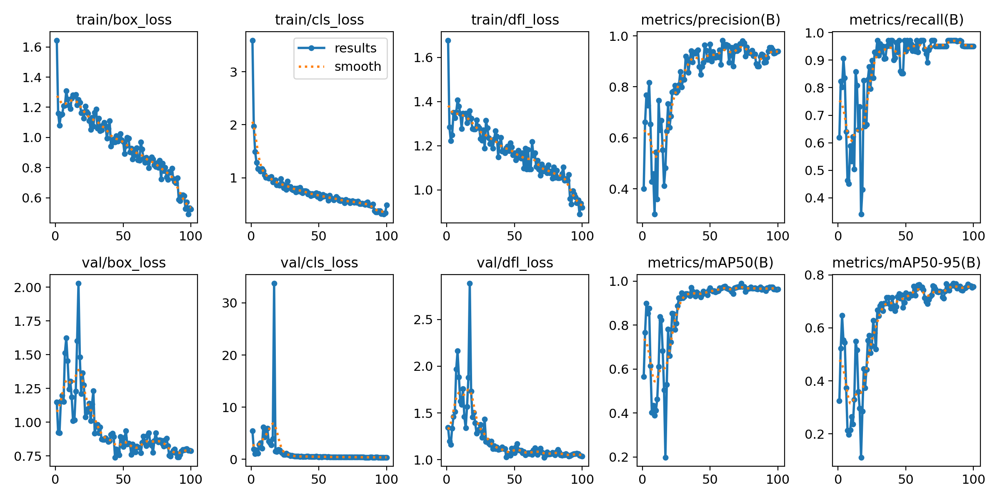

In [10]:
plot_results = Path(results_dir) / "results.png"
if plot_results.exists():
    results_img = Image.open(plot_results)
    print("Training Results:")
    display(results_img) 

<h2 style="color: #39FF14; font-weight: bold;">Download Pre-trained Model</h2>

Download a pre-trained model for testing.

In [21]:
pretrained_dir = Path("model")
pretrained_dir.mkdir(exist_ok=True)

pretrained_model_path = pretrained_dir / "best.pt"

model_folder_id = "1wLzSJ60WbYNdYYDjWx2EK1skVjVywjKM"

try:
    model_file_id = "1wLzSJ60WbYNdYYDjWx2EK1skVjVywjKM"
    pretrained_dir.mkdir(exist_ok=True, parents=True)
    gdown.download_folder(id=model_file_id, output=str(pretrained_dir), quiet=False)
    print(f"Model downloaded to {pretrained_model_path}")
    
except Exception as e:
    print(f"Error downloading pre-trained model: {e}")
    print("Please download the model manually from: https://drive.google.com/drive/folders/1wLzSJ60WbYNdYYDjWx2EK1skVjVywjKM?usp=sharing")

# Use the pre-trained model for inference
model_path_for_inference = pretrained_model_path if pretrained_model_path else best_model_path
print(f"Using model at {model_path_for_inference} for inference")

Retrieving folder contents


Processing file 1KH1B-Pw2FwfyFgtBlRj_sQsURtk9NQ7_ best.pt


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1KH1B-Pw2FwfyFgtBlRj_sQsURtk9NQ7_
To: d:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\model\best.pt
100%|██████████| 22.5M/22.5M [00:02<00:00, 10.5MB/s]

Model downloaded to model\best.pt
Using model at model\best.pt for inference



Download completed


<h2 style="color: #39FF14; font-weight: bold;">Test Inference with YOLOv8</h2>

Running inference on a test image to verify our model can detect giraffes and rhinoceros.


image 1/1 d:\UNI\Computer Vision\computer-vision-portfolio-1\exercise_1_object_detection\dataset\test_images\IMG_20250419_122011.jpg: 480x640 1 rhinoceros, 34.8ms
Speed: 5.4ms preprocess, 34.8ms inference, 3.2ms postprocess per image at shape (1, 3, 480, 640)
Detected Animals in IMG_20250419_122011.jpg:


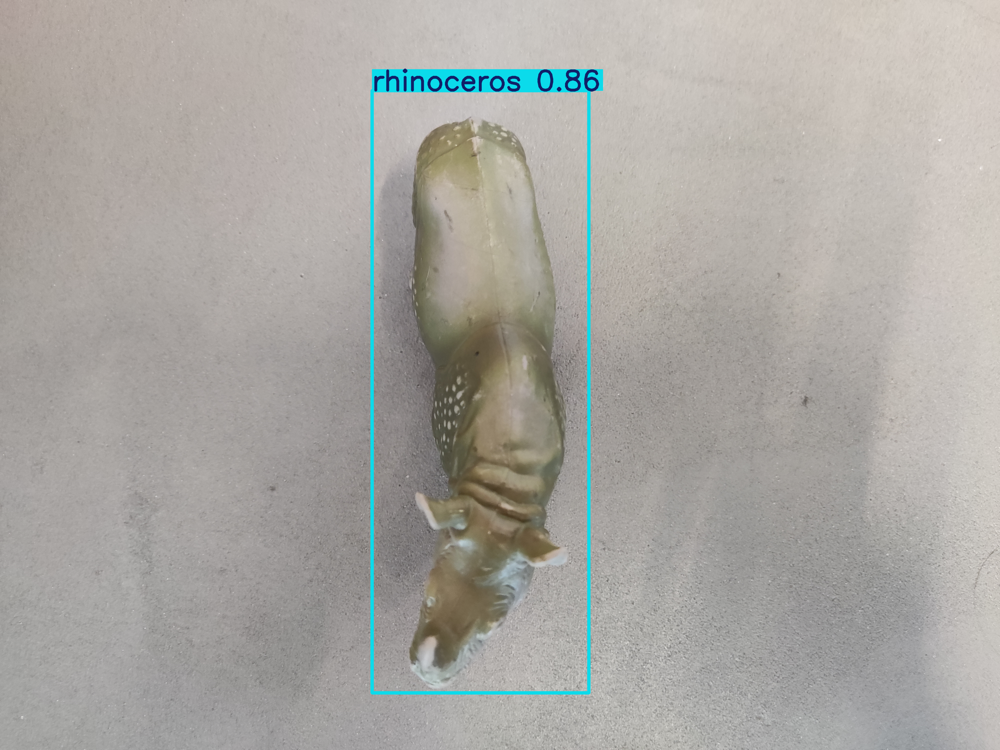

Found 1 animals:
rhinoceros: 0.86 confidence


In [25]:
img_path = "dataset/test_images/IMG_20250419_122011.jpg"

run_inference(str(model_path_for_inference), img_path);